Python File 3

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from skimpy import skim
import scipy.stats as st
import seaborn as sns
from itertools import combinations
import numpy as np

In [3]:
df = pd.read_csv("Fast_Food_nonull.csv")

In [4]:
# Splitting the data into categorical and continuous
cat_feats = df.select_dtypes(include = ['object']).columns
cont_feats = df.select_dtypes(exclude = ['object']).columns

# Bivariate Analysis (Inbetween Both Categorical and Conintuous)

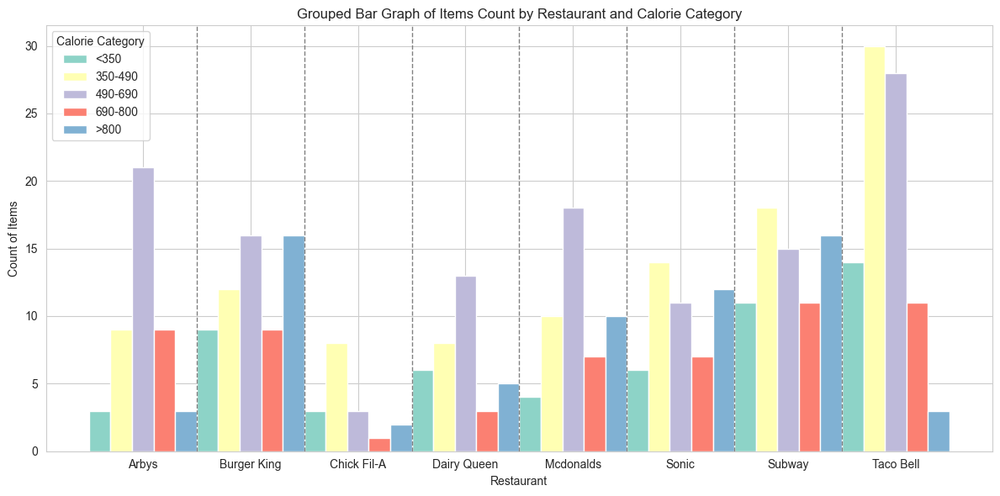

In [5]:
# Calories categories
calorie_bins = [0, 350, 490, 690, 800, float('inf')]
calorie_labels = ['<350', '350-490', '490-690', '690-800', '>800']

# A new column that categorizes the calories based on the assigned calorie_bins and labels
df['calorie_category'] = pd.cut(df['calories'], bins = calorie_bins, labels = calorie_labels)

# Filter the DataFrame for the first category (calories >= 300)
category1_data = df[df['calories'] >= 300]

# Pivot the data to create a grouped bar graph
pivot_data = category1_data.pivot_table(index = 'restaurant', columns = 'calorie_category',
                                        values = 'calories', aggfunc = 'count', fill_value = 0)

# Style
sns.set_style("whitegrid")

# Grouped bar graph
plt.figure(figsize = (12, 6))  # Adjust figure size as needed

# Color palette
palette = sns.color_palette("Set3", len(calorie_labels))

# Get the restaurant names
restaurants = pivot_data.index

# Bar width and positions
bar_width = 0.2  
index = range(len(restaurants))

# Plot each calorie category separately
for i, label in enumerate(calorie_labels):
    plt.bar(
        [pos + bar_width * i for pos in index],
        pivot_data[label],
        width=bar_width,
        label=label,
        color=palette[i]
    )

# Vertical lines for seperation
for pos in index[1:]:
    plt.axvline(pos - bar_width / 2, color='gray', linestyle='--', linewidth=1)

# Configure x-axis
plt.xlabel('Restaurant')
plt.ylabel('Count of Items')
plt.title('Grouped Bar Graph of Items Count by Restaurant and Calorie Category')
plt.xticks([pos + bar_width * 2 for pos in index], restaurants)  # Adjust the tick positions

# Legend
plt.legend(title='Calorie Category', loc='upper left')

plt.tight_layout()
plt.show()


Observations:
- Restaurant with most menu items containing less that 350 calories is Taco Bell.
- Restaurants with least <350 calorie menu items are Arbys, Chick Fil-A and Mcdonalds.
- Chick Fil-A mostly has low calorie menu items (350-490)
- Taco Bell has equal menu items in the low calorie (350-490) and reasonable calorie (490-690) categories.
- Burger King and Subway are the restaurants with the most high calorie menu items (>800).
- Mcdonalds and Sonic 

# Analysis on Calories

In [ ]:
# Define the categories and colors for stacked bar plots
categories = ['cal_fat', 'calories']
colors = ['#FF5733', '#FFA500']

# Get restaurant names
restaurants = df['restaurant'].unique()

# Loop through each restaurant
for restaurant in restaurants:
    restaurant_data = df[df['restaurant'] == restaurant]
    
    # Create a stacked bar plot with two bars on top of each other
    plt.figure(figsize = (130, 90))
    plt.bar(restaurant_data['item'], restaurant_data['calories'], label = 'Total Calories', color = colors[1])
    plt.bar(restaurant_data['item'], restaurant_data['cal_fat'], label = 'Calories from Fat', color = colors[0])
    
    plt.xlabel('Menu Item', fontsize = 120)
    plt.ylabel('Calories', fontsize = 120)
    plt.title(f'Stacked Bar Plot for {restaurant}', fontsize = 120)
    plt.legend(title = 'Category', fontsize = 120, loc = 'upper right' )
    
    plt.xticks(rotation = 90, fontsize = 80)
    plt.yticks(fontsize = 120)
    
    plt.tight_layout()
    
    plt.show()


# Analysis:

1- Mcdonalds:
- The menu item with the highest calorie count is "20 Piece Buttermilk Crispy Chicken Tenders" with a count that approximately = 2400 calories. In addition, about 1400 calories are calories from fat.
- The menu item with the least calories is the "Premium Asian Salad w/o Chicken".
- The menu items with the least amount of calories from fat are the "Artisan Grilled Cheese Sandwich" and the "Lobster Roll."

2- Chick Fil-A:
- The menu item with the highest calorie count is "30 Piece Chicken Nuggets" with a count that approximately = 1000 calories. In addition, about 400 calories are calories from fat.
- The menu item with the least calories is "4 Piece Grilled Chicken Nuggets" with a calorie count of approx. 100. In addition, about 20 calories are calories from fat.
- The menu item with the least amount of calories from fat is also the "4 Piece Grilled Chicken Nuggets."

3- Sonic:
- The menu item with the highest calorie count is "Garlic Parmesan Dunked Ultimate Chicken Sandwich" with a count that approx. = 1400. In addition, about 800 clories are calories from fat.
- The menu item with the least calories is the "Corn Dog" with a calorie count of approx. 200 calories. In addition, about 100 calories are calories from fat.
- The menu item with the least amount of calories from fat is also the "Corn Dog."

4- Arbys:
- The menu item with the highest calorie count is the"Triple Decker Sandwich" with a count that approx. = 1000. In addition, about 420 clories are calories from fat.
- The menu item with the least calories is the "Chopped Side Salad" with a calorie count of approx. 200 calories. In addition, about 100 calories are calories from fat.
- The menu item with the least amount of calories from fat is also the "Chopped Side Salad."

5- Burger King
- The menu item with the highest calorie count is the "American Brewhouse King" with a count that approx. = 1550. In addition, about 1300 clories are calories from fat.
- The menu item with the least calories is the "4 Piece Chicken Nuggets" with a calorie count of approx. 200 calories. In addition, about 100 calories are calories from fat.
- The menu item with the least amount of calories from fat is the "Hamburger."

6- Dairy Queen
- The menu item with the highest calorie count is the "6 Piece Chicken Strip Basket w/ Country Gravy" with a count that approx. = 1300. In addition, about 600 clories are calories from fat.
- The menu item with the least calories is the "Side Salad" with a calorie count of approx. 25 calories with no fat calories.
- The menu item with the least amount of calories from fat is also the "Side Salad."

7- Subway
- The menu item with the highest calorie count is the "Footlong Big Hot Pastrami" with a count that approx. = 1190. In addition, about 600 clories are calories from fat.
- The menu item with the least calories is the "Veggie Delite Salad" with a calorie count of approx. 50 calories. In addition, about 10 calories are calories from fat.
- The menu item with the least amount of calories from fat are the salads: "Turkey Breast and Ham", "Turkey Breast", and "Veggie Delite" Salads.

8- Taco Bell
- The menu item with the highest calorie count is the "XXL Grilled Stuft Burrito - Beef" with a count that approx. = 900. In addition, about 400 clories are calories from fat.
- The menu item with the least calories is the "Freso Crunchy Taco" with a calorie count of approx. 150 calories. In addition to about 70 calories from fat.
- The menu item with the least amount of calories from fat the "Fresco Grilled Steak Soft Taco."

- More info is to be discerned from the plots.

# Analysis on Fats

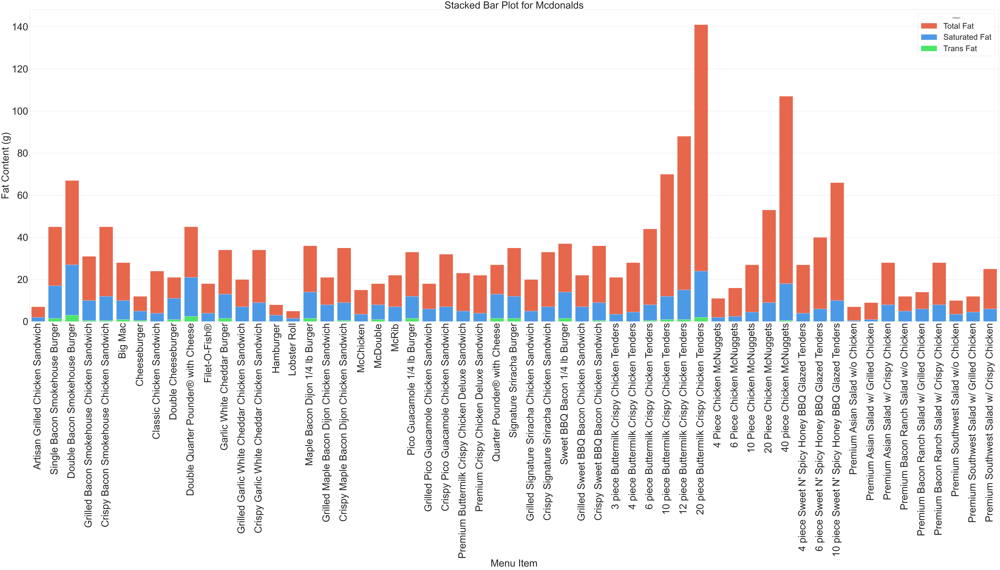

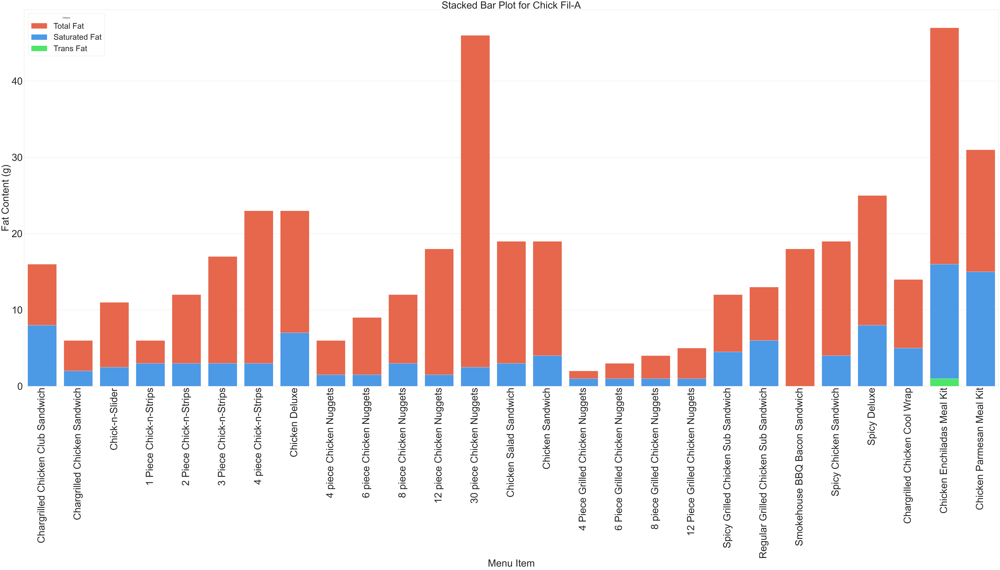

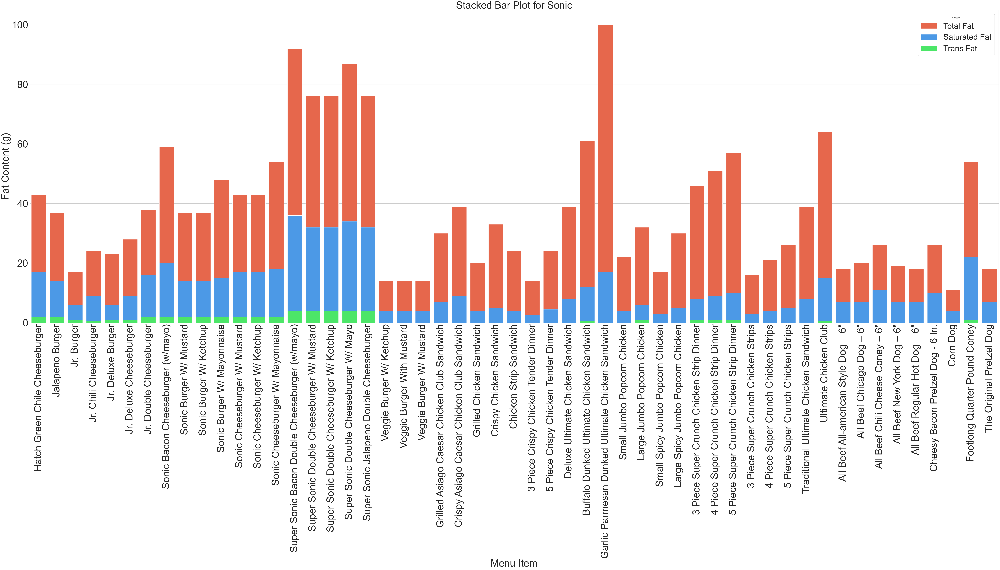

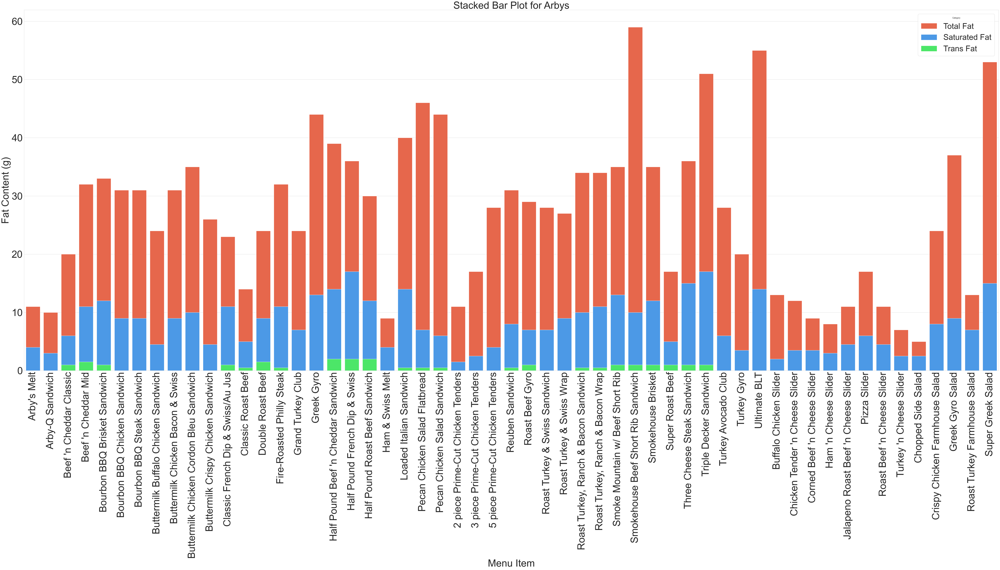

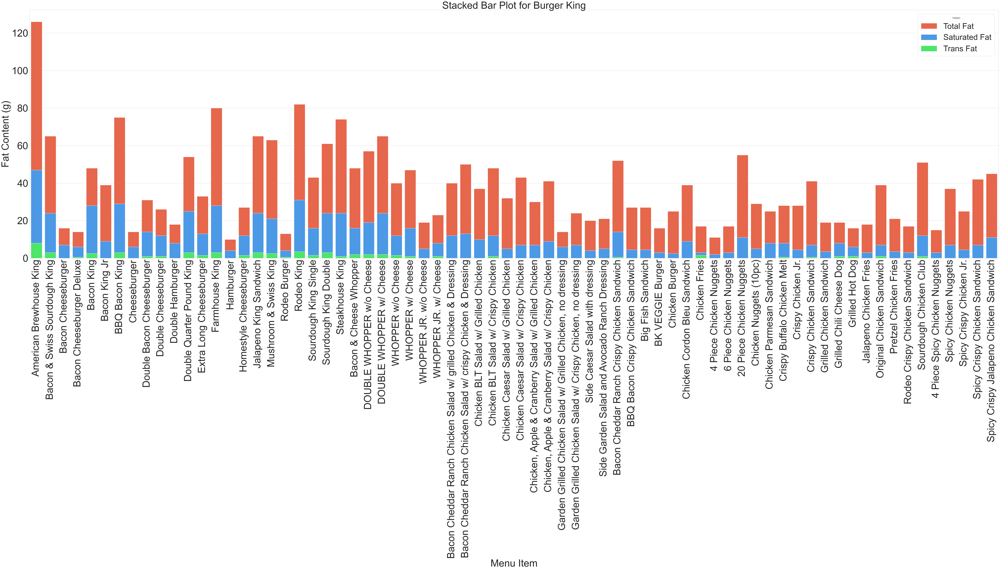

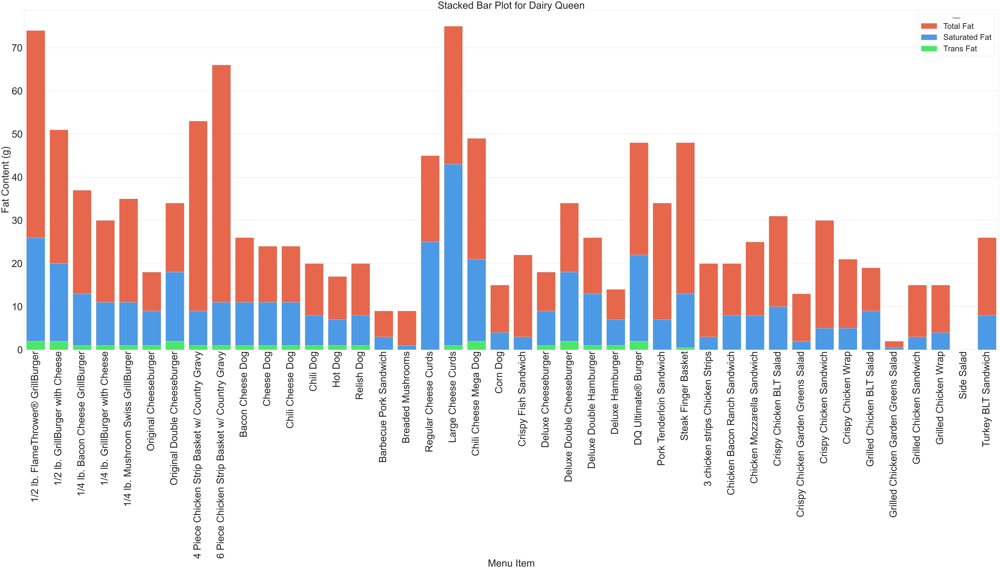

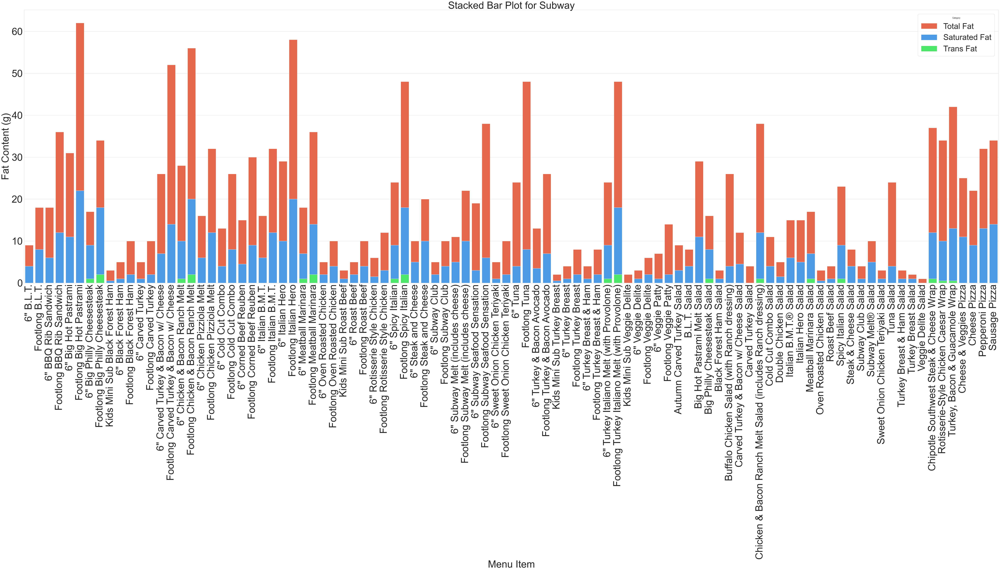

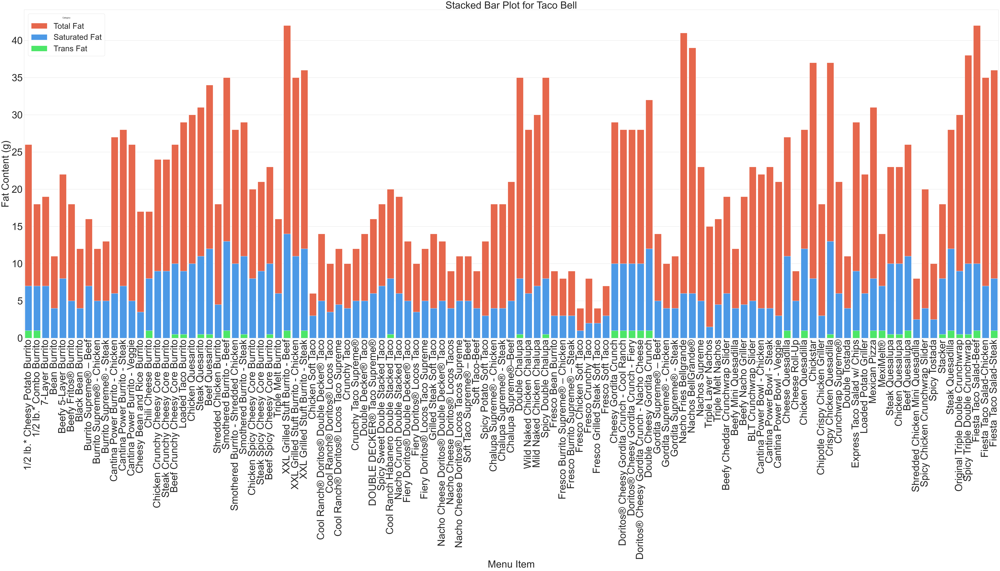

In [7]:
# Categories
categories = ['total_fat', 'sat_fat', 'trans_fat']
colors = ['#FF5733', '#3399FF', '#33FF57']

# Get restaurant names
restaurants = df['restaurant'].unique()

# Loop through each restaurant
for restaurant in restaurants:
    restaurant_data = df[df['restaurant'] == restaurant]
    
    # Create a stacked bar plot
    plt.figure(figsize = (70, 40))
    sns.barplot(data = restaurant_data, x = 'item', y = 'total_fat', label = 'Total Fat', color = colors[0])
    sns.barplot(data = restaurant_data, x = 'item', y = 'sat_fat', label = 'Saturated Fat', color = colors[1])
    sns.barplot(data = restaurant_data, x = 'item', y = 'trans_fat', label = 'Trans Fat', color = colors[2])
    
    plt.xlabel('Menu Item', fontsize = 50)
    plt.ylabel('Fat Content (g)', fontsize = 50)
    plt.title(f'Stacked Bar Plot for {restaurant}', fontsize = 50)
    plt.legend(title='Category', fontsize = 40)
    
    plt.xticks(rotation = 90, fontsize = 50)
    plt.yticks(fontsize = 50)

    plt.tight_layout()
    plt.show()


Analysis (Fat is measured in grams):

1- Mcdonalds:
- Menu item with highest total fat is the "20 Piece Buttermilk Crispy Chicken Tenders". Total fat = approx. 140, Sat fat = approx. 25, and Trans fat = approx. 5
- Meny item with least total fat is the "Lobster Roll". Total fat = approx. 6, Sat fat = approx. 3, Trans Fat = 0.

2- Chick Fil-A:
- Menu item with highest total fat is the "Chicken Enchiladas Meal Kit". Total fat = approx. 50 , Sat fat = approx. 20, and Trans fat = approx. 2
- Menu item with least total fat is the "4 Piece Grilled Chicken Nuggets". Total fat = approx. 3 , Sat fat = approx. 1, Trans Fat = 0.

3- Sonic:
- Menu item with highest total fat is the "Garlic Parmesean Dunked Ultimate Chicken Sandwich". Total fat = approx. 100, Sat fat = approx. 19, and Trans fat = 0 
- Menu item with least total fat is the "Corn Dog". Total fat = approx. 10 , Sat fat = approx. 5, Trans Fat = 0.

4- Arbys:
- Menu item with highest total fat is the "Smokehouse Beef Short Rib Sandwich". Total fat = approx. 58 , Sat fat = approx. 10, and Trans fat = approx. 3
- Menu item with least total fat is the "Chopped Side Salad". Total fat = approx. 5 , Sat fat = approx. 2.5, Trans Fat = 0.

5- Burger King:
- Menu item with highest total fat is the "American Brewhouse King". Total fat = approx. 125 , Sat fat = approx. 45, and Trans fat = approx. 10
- Menu item with least total fat is the "Hamburger". Total fat = approx. 10 , Sat fat = approx. 5, Trans Fat = 0.

6- Dairy Queen:
- Menu item with highest total fat is the "Large Cheese Curds". Total fat = approx. 72, Sat fat = approx. 45, and Trans fat = approx. 2
- Menu item with least total fat is the "Grilled Chicken Garden Green Salad". Total fat = approx. 2 , Sat fat = approx.15, Trans Fat = 0.

7- Subway:
- Menu item with highest total fat is the "Footlong Big Hot Pastrami". Total fat = approx. 62 , Sat fat = approx. 22, and Trans fat = 0.
- Menu item with least total fat is the "Veggie Delite Salad" with no Sat nor Trans fats.

8- Taco Bell:
- Menu items with highest total fat are the "XXL Grilled Stuft Burrito - Beef". Total fat = approx. 45, Sat fat = approx. 14, and Trans fat = approx. 1. In addition to "Fiesta Taco Salad-Beef". Total fat = approx. 44, Sat fat = approx. 10, and Trans fat = approx. 1
- Menu items with least total fat are the "Fresco Chicken Soft Taco". Total fat = approx. 4 , Sat fat = approx. 1,and zero Trans Fat. In addition to "Fresco Grilled Steak Soft Taco". Total fat = approx. 4 , Sat fat = approx. 2, and zero Trans Fat.

- More info is to be discerned from the plots.

# General Analysis on Vitamins A & C

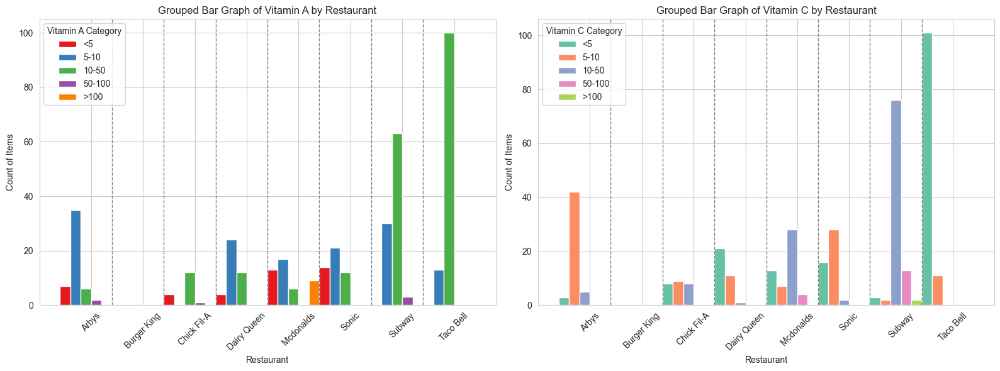

In [8]:
# Vitamins A & C

# Vitamin categories
vitamin_bins = [0, 5, 10, 50, 100, float('inf')]
vitamin_labels = ['<5', '5-10', '10-50', '50-100', '>100']

# Create new columns for vitamin A and vitamin C categories
df['vit_a_cat'] = pd.cut(df['vit_a'], bins = vitamin_bins, labels = vitamin_labels)
df['vit_c_cat'] = pd.cut(df['vit_c'], bins = vitamin_bins, labels = vitamin_labels)

# Filter the DataFrame for the desired range
category_data_A = df[df['vit_a'] >= 0]
category_data_C = df[df['vit_c'] >= 0]

# Pivot the data to create grouped bar graphs
pivot_data_A = category_data_A.pivot_table(index = 'restaurant', columns = 'vit_a_cat',
                                           values = 'item', aggfunc = 'count', fill_value = 0)

pivot_data_C = category_data_C.pivot_table(index = 'restaurant', columns = 'vit_c_cat',
                                           values = 'item', aggfunc = 'count', fill_value = 0)

# Style
sns.set_style("whitegrid")

# Subplots for vitamin A and vitamin C
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

# Color palettes
palette_A = sns.color_palette("Set1", len(vitamin_labels))
palette_C = sns.color_palette("Set2", len(vitamin_labels))

# Bar positions
x_pos = range(len(pivot_data_A.index))
bar_width = 0.2  

# Plot vitamin A data
for i, label in enumerate(vitamin_labels):
    ax1.bar(
        [pos + bar_width * i for pos in x_pos],
        pivot_data_A[label],
        width = bar_width,
        label = label,
        color = palette_A[i]
    )

ax1.set_xlabel('Restaurant')
ax1.set_ylabel('Count of Items')
ax1.set_title('Grouped Bar Graph of Vitamin A by Restaurant')
ax1.set_xticks([pos + bar_width * (len(vitamin_labels) / 2) for pos in x_pos])
ax1.set_xticklabels(pivot_data_A.index, rotation = 45)
ax1.legend(title = 'Vitamin A Category', loc = 'upper left')

# Plot vitamin C data
for i, label in enumerate(vitamin_labels):
    ax2.bar(
        [pos + bar_width * i for pos in x_pos],
        pivot_data_C[label],
        width = bar_width,
        label = label,
        color = palette_C[i]
    )

ax2.set_xlabel('Restaurant')
ax2.set_ylabel('Count of Items')
ax2.set_title('Grouped Bar Graph of Vitamin C by Restaurant')
ax2.set_xticks([pos + bar_width * (len(vitamin_labels) / 2) for pos in x_pos])
ax2.set_xticklabels(pivot_data_C.index, rotation = 45)
ax2.legend(title = 'Vitamin C Category', loc='upper left')

# Vertical lines for seperation
for pos in x_pos[1:]:
    ax1.axvline(x = (pos - bar_width / 2), color = 'gray', linestyle = '--', linewidth = 1)
    ax2.axvline(x = (pos - bar_width / 2), color = 'gray', linestyle = '--', linewidth = 1)

plt.tight_layout()
plt.show()
